In [1]:
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np

def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()
    
def plot_images(imgs, figsize_in_inches=(5,5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

In [4]:
from pathlib import Path
def get_image_paths(img_set):
    return [str(path.relative_to('.')) for path in Path('imgs').rglob(f'{img_set}*')]

fish_imgs = get_image_paths('fish')


In [5]:
from stitching.images import Images

images = Images.of(fish_imgs)

medium_imgs = list(images.resize(Images.Resolution.MEDIUM))
low_imgs = list(images.resize(Images.Resolution.LOW))
final_imgs = list(images.resize(Images.Resolution.FINAL))


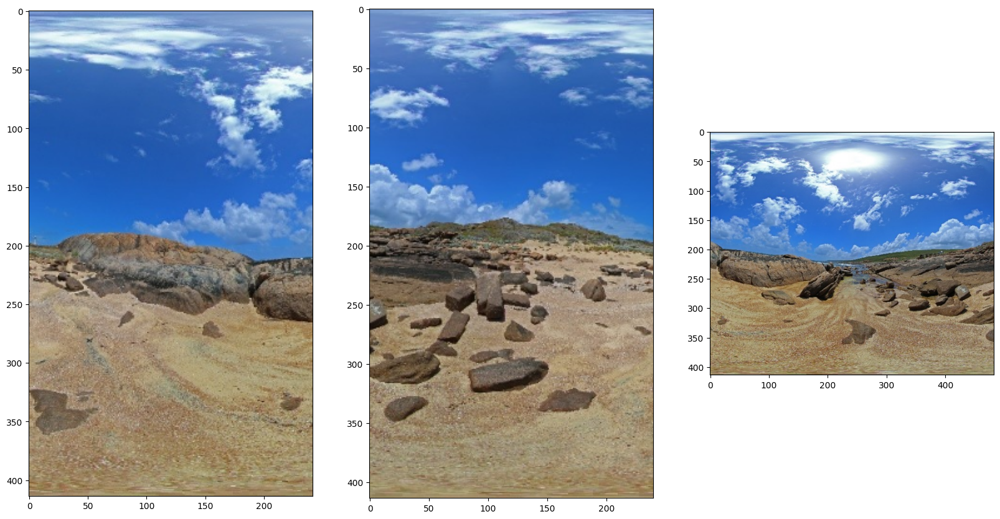

In [6]:
plot_images(low_imgs, (20,20))

Image 1:


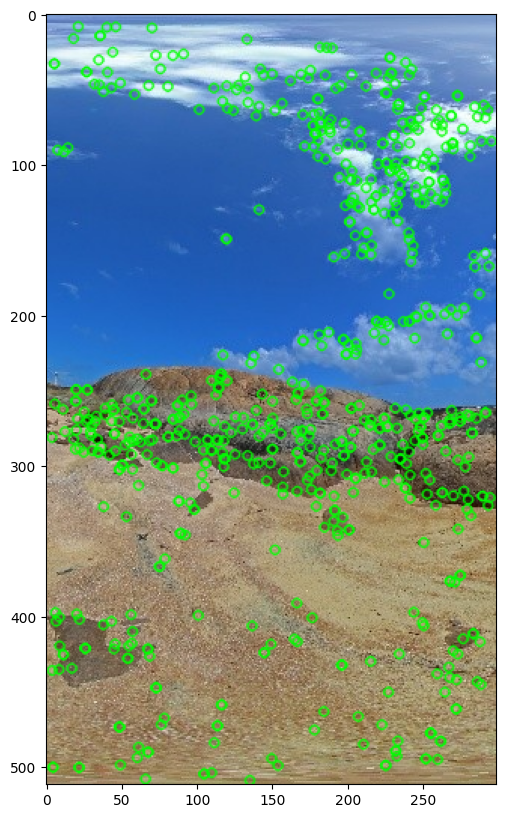

Image 2:


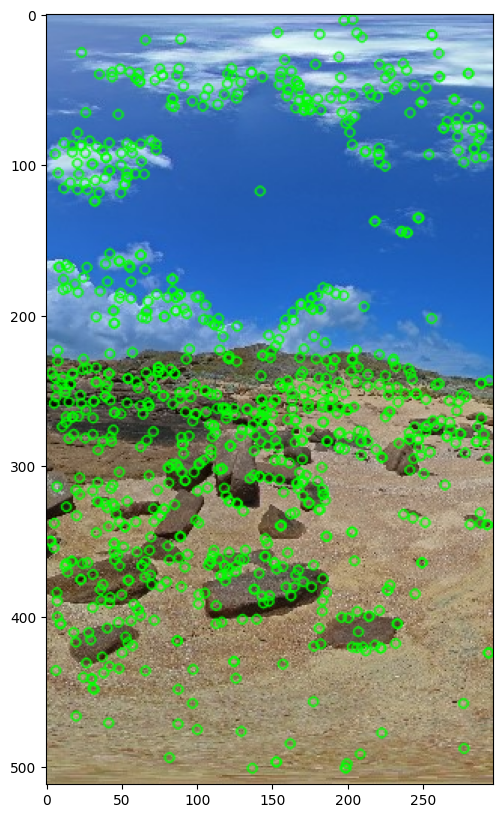

Image 3:


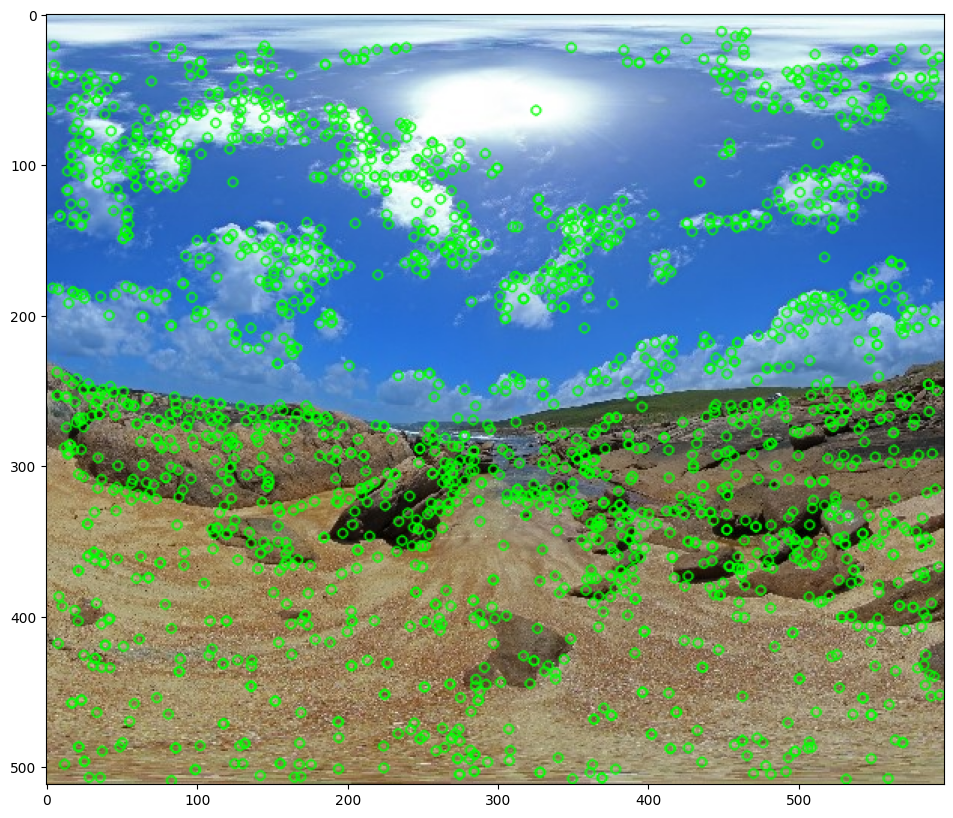

In [13]:
from stitching.feature_detector import FeatureDetector
finder = FeatureDetector(detector='sift')
features = [finder.detect_features(img) for img in medium_imgs]
# Plot features for all images
for idx, (img, feature) in enumerate(zip(medium_imgs, features)):
    print(f"Image {idx + 1}:")
    keypoints_img = finder.draw_keypoints(img, feature)
    plot_image(keypoints_img, (15, 10))

In [14]:
from stitching.feature_matcher import FeatureMatcher

matcher = FeatureMatcher()
matches = matcher.match_features(features)

In [15]:
matcher.get_confidence_matrix(matches)

array([[0.        , 0.40816327, 1.44475921],
       [0.40816327, 0.        , 1.35977337],
       [1.44475921, 1.35977337, 0.        ]])

Matches Image 1 to Image 3


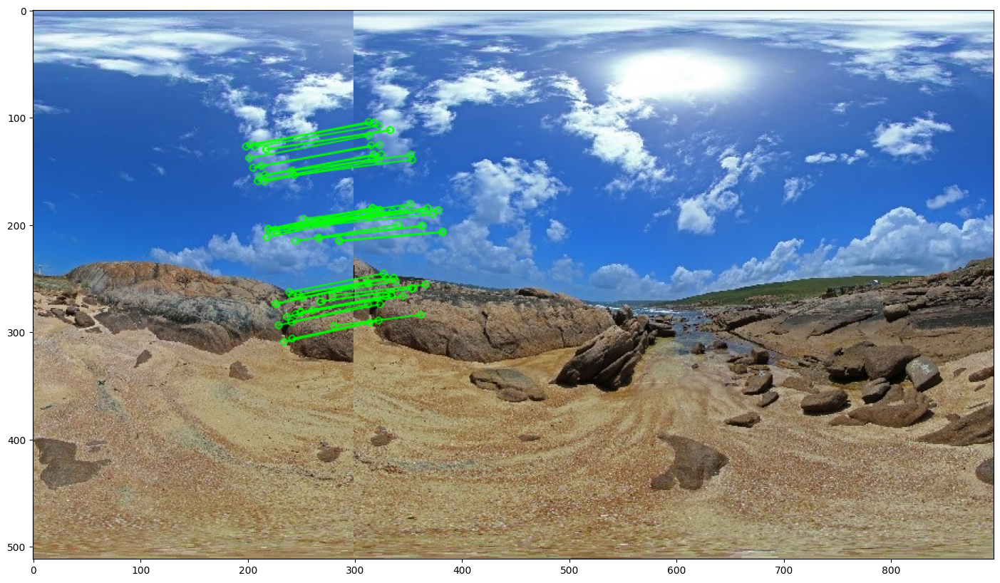

Matches Image 2 to Image 3


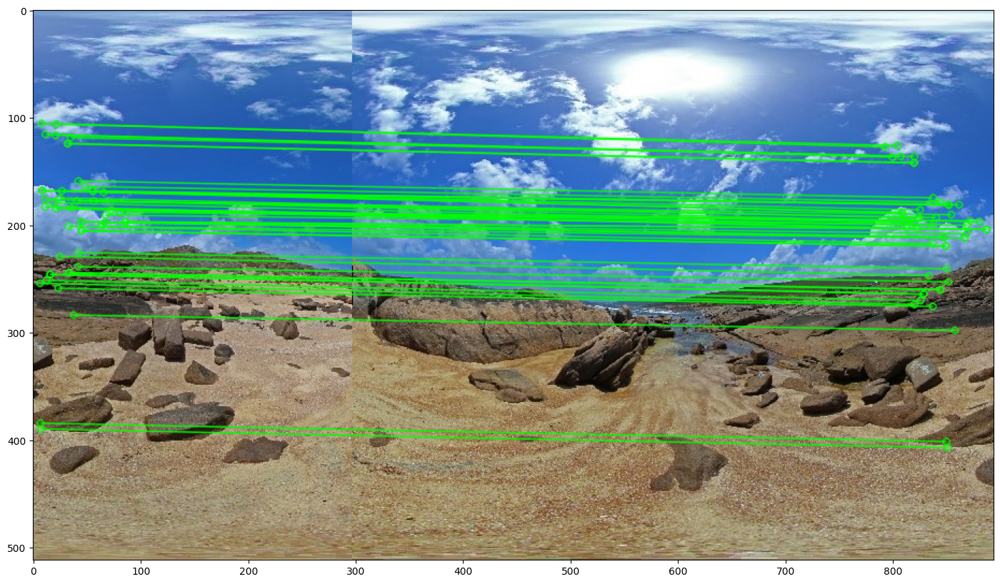

In [16]:
all_relevant_matches = matcher.draw_matches_matrix(medium_imgs, features, matches, conf_thresh=1, 
                                                   inliers=True, matchColor=(0, 255, 0))

for idx1, idx2, img in all_relevant_matches:
    print(f"Matches Image {idx1+1} to Image {idx2+1}")
    plot_image(img, (20,10))

In [17]:
from stitching.subsetter import Subsetter

subsetter = Subsetter()
dot_notation = subsetter.get_matches_graph(images.names, matches)
print(dot_notation)

graph matches_graph{
"fish_1.jpg" -- "fish_2.jpg"[label="Nm=91, Ni=51, C=1.44476"];
"fish_3.jpg" -- "fish_2.jpg"[label="Nm=91, Ni=48, C=1.35977"];
}


![alt text](graphviz.svg)

In [18]:
indices = subsetter.get_indices_to_keep(features, matches)

medium_imgs = subsetter.subset_list(medium_imgs, indices)
low_imgs = subsetter.subset_list(low_imgs, indices)
final_imgs = subsetter.subset_list(final_imgs, indices)
features = subsetter.subset_list(features, indices)
matches = subsetter.subset_matches(matches, indices)

images.subset(indices)

print(images.names)
print(matcher.get_confidence_matrix(matches))

['imgs/fish_1.jpg', 'imgs/fish_3.jpg', 'imgs/fish_2.jpg']
[[0.         0.40816327 1.44475921]
 [0.40816327 0.         1.35977337]
 [1.44475921 1.35977337 0.        ]]


In [19]:
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector

camera_estimator = CameraEstimator()
camera_adjuster = CameraAdjuster()
wave_corrector = WaveCorrector()

cameras = camera_estimator.estimate(features, matches)
cameras = camera_adjuster.adjust(features, matches, cameras)
cameras = wave_corrector.correct(cameras)

In [20]:
from stitching.warper import Warper

warper = Warper()

In [21]:
warper.set_scale(cameras)

In [22]:
low_sizes = images.get_scaled_img_sizes(Images.Resolution.LOW)
camera_aspect = images.get_ratio(Images.Resolution.MEDIUM, Images.Resolution.LOW)  # since cameras were obtained on medium imgs

warped_low_imgs = list(warper.warp_images(low_imgs, cameras, camera_aspect))
warped_low_masks = list(warper.create_and_warp_masks(low_sizes, cameras, camera_aspect))
low_corners, low_sizes = warper.warp_rois(low_sizes, cameras, camera_aspect)

In [23]:
final_sizes = images.get_scaled_img_sizes(Images.Resolution.FINAL)
camera_aspect = images.get_ratio(Images.Resolution.MEDIUM, Images.Resolution.FINAL)

warped_final_imgs = list(warper.warp_images(final_imgs, cameras, camera_aspect))
warped_final_masks = list(warper.create_and_warp_masks(final_sizes, cameras, camera_aspect))
final_corners, final_sizes = warper.warp_rois(final_sizes, cameras, camera_aspect)

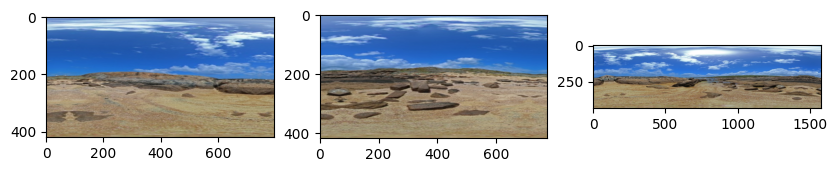

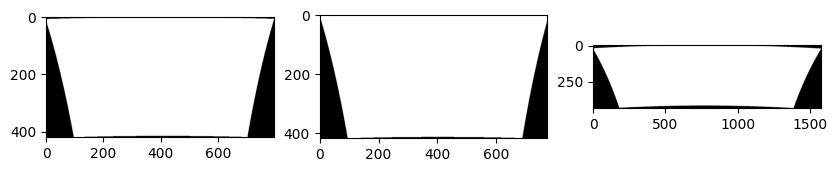

In [24]:
plot_images(warped_low_imgs, (10,10))
plot_images(warped_low_masks, (10,10))

In [26]:
print(final_corners)
print(final_sizes)

[(-1527, 1527), (542, 1557), (-981, 1527)]
[(983, 517), (959, 517), (1949, 534)]


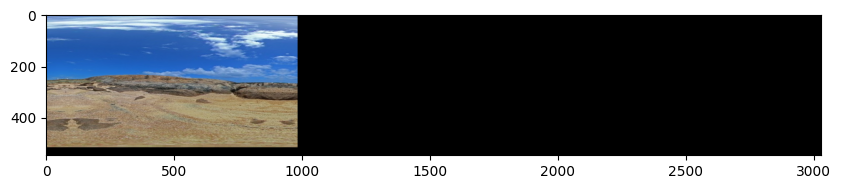

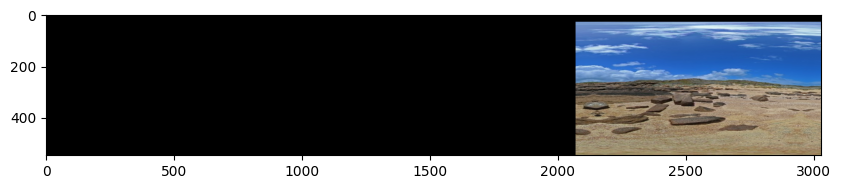

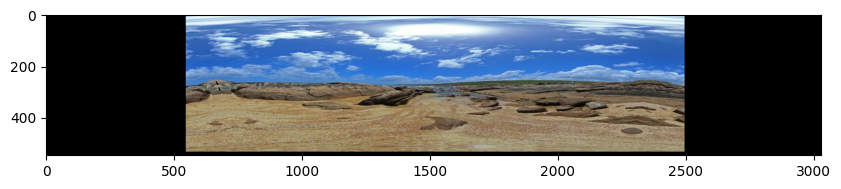

In [27]:
from stitching.timelapser import Timelapser

timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(warped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

In [28]:
from stitching.cropper import Cropper

cropper = Cropper()

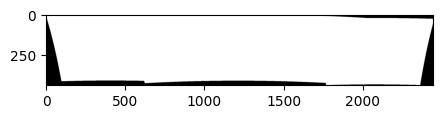

In [29]:
mask = cropper.estimate_panorama_mask(warped_low_imgs, warped_low_masks, low_corners, low_sizes)
plot_image(mask, (5,5))

In [30]:
lir = cropper.estimate_largest_interior_rectangle(mask)

/home/sxin/code/SUQAD/stitching_tutorial/.venv/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


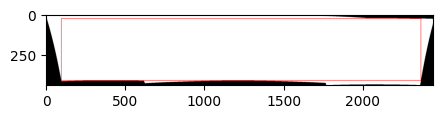

In [32]:
plot = lir.draw_on(mask, size=2)
plot_image(plot, (5,5))

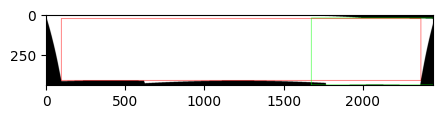

In [33]:
low_corners = cropper.get_zero_center_corners(low_corners)
rectangles = cropper.get_rectangles(low_corners, low_sizes)

plot = rectangles[1].draw_on(plot, (0, 255, 0), 2)  # The rectangle of the center img
plot_image(plot, (5,5))

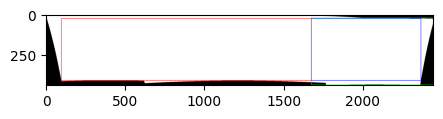

In [34]:
overlap = cropper.get_overlap(rectangles[1], lir)
plot = overlap.draw_on(plot, (255, 0, 0), 2)
plot_image(plot, (5,5))

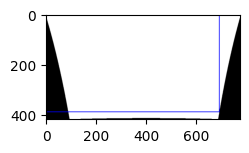

In [35]:
intersection = cropper.get_intersection(rectangles[1], overlap)
plot = intersection.draw_on(warped_low_masks[1], (255, 0, 0), 2)
plot_image(plot, (2.5,2.5))

In [36]:
cropper.prepare(warped_low_imgs, warped_low_masks, low_corners, low_sizes)

cropped_low_masks = list(cropper.crop_images(warped_low_masks))
cropped_low_imgs = list(cropper.crop_images(warped_low_imgs))
low_corners, low_sizes = cropper.crop_rois(low_corners, low_sizes)

lir_aspect = images.get_ratio(Images.Resolution.LOW, Images.Resolution.FINAL)  # since lir was obtained on low imgs
cropped_final_masks = list(cropper.crop_images(warped_final_masks, lir_aspect))
cropped_final_imgs = list(cropper.crop_images(warped_final_imgs, lir_aspect))
final_corners, final_sizes = cropper.crop_rois(final_corners, final_sizes, lir_aspect)

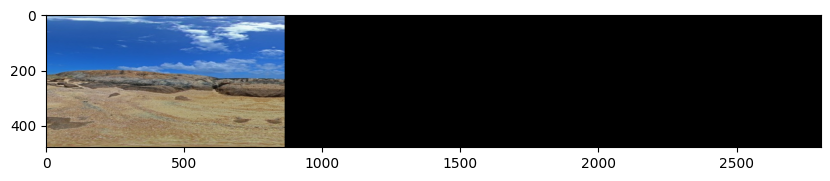

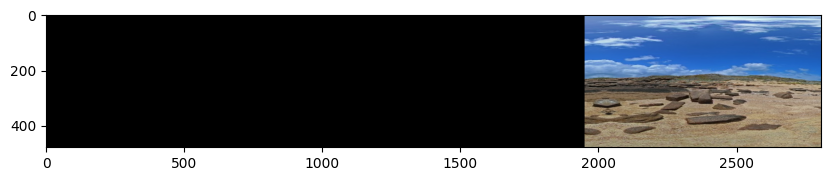

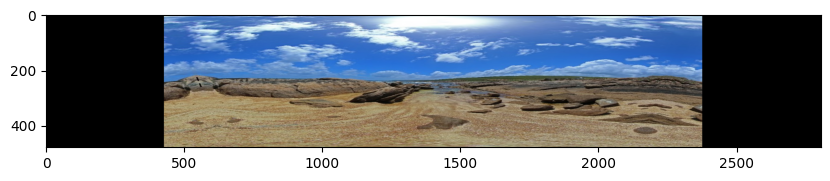

In [37]:
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(cropped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

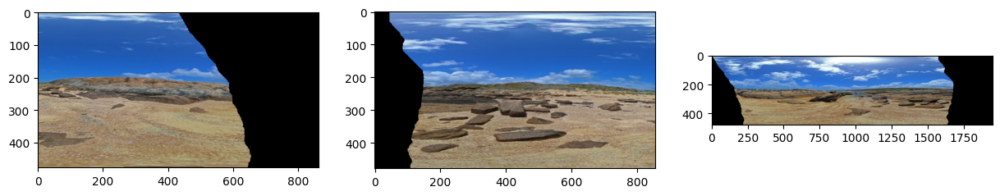

In [38]:
from stitching.seam_finder import SeamFinder

seam_finder = SeamFinder()

seam_masks = seam_finder.find(cropped_low_imgs, low_corners, cropped_low_masks)
seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, cropped_final_masks)]

seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(cropped_final_imgs, seam_masks)]
plot_images(seam_masks_plots, (15,10))

In [40]:
from stitching.exposure_error_compensator import ExposureErrorCompensator

compensator = ExposureErrorCompensator()

compensator.feed(low_corners, cropped_low_imgs, cropped_low_masks)

compensated_imgs = [compensator.apply(idx, corner, img, mask) 
                    for idx, (img, mask, corner) 
                    in enumerate(zip(cropped_final_imgs, cropped_final_masks, final_corners))]

In [41]:
from stitching.blender import Blender

blender = Blender()
blender.prepare(final_corners, final_sizes)
for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
    blender.feed(img, mask, corner)
panorama, _ = blender.blend()

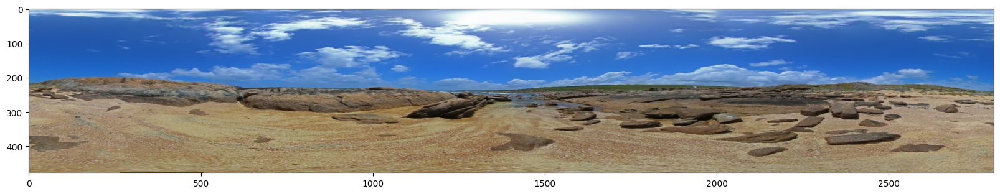

In [47]:
plot_image(panorama, (20,20))

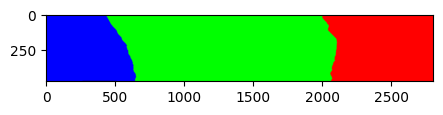

In [48]:
blended_seam_masks = seam_finder.blend_seam_masks(seam_masks, final_corners, final_sizes)
plot_image(blended_seam_masks, (5,5))

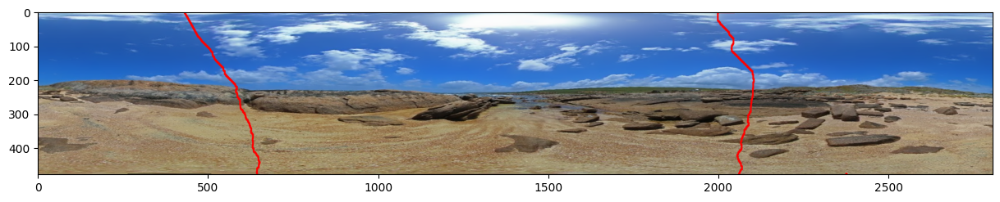

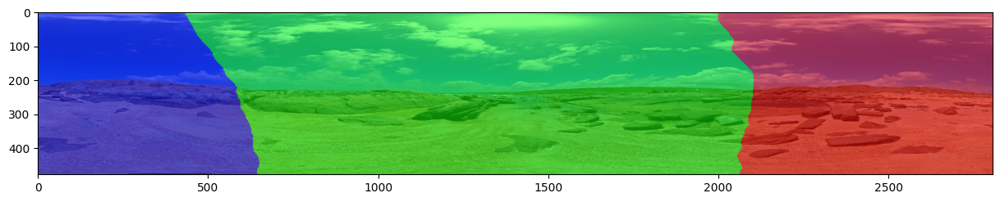

In [49]:
plot_image(seam_finder.draw_seam_lines(panorama, blended_seam_masks, linesize=3), (15,10))
plot_image(seam_finder.draw_seam_polygons(panorama, blended_seam_masks), (15,10))

In [51]:
from stitching import AffineStitcher

print(AffineStitcher.AFFINE_DEFAULTS)
# Comparison:
# print(Stitcher.DEFAULT_SETTINGS)
# print(AffineStitcher.DEFAULT_SETTINGS)

{'estimator': 'affine', 'wave_correct_kind': 'no', 'matcher_type': 'affine', 'adjuster': 'affine', 'warper_type': 'affine', 'compensator': 'no'}


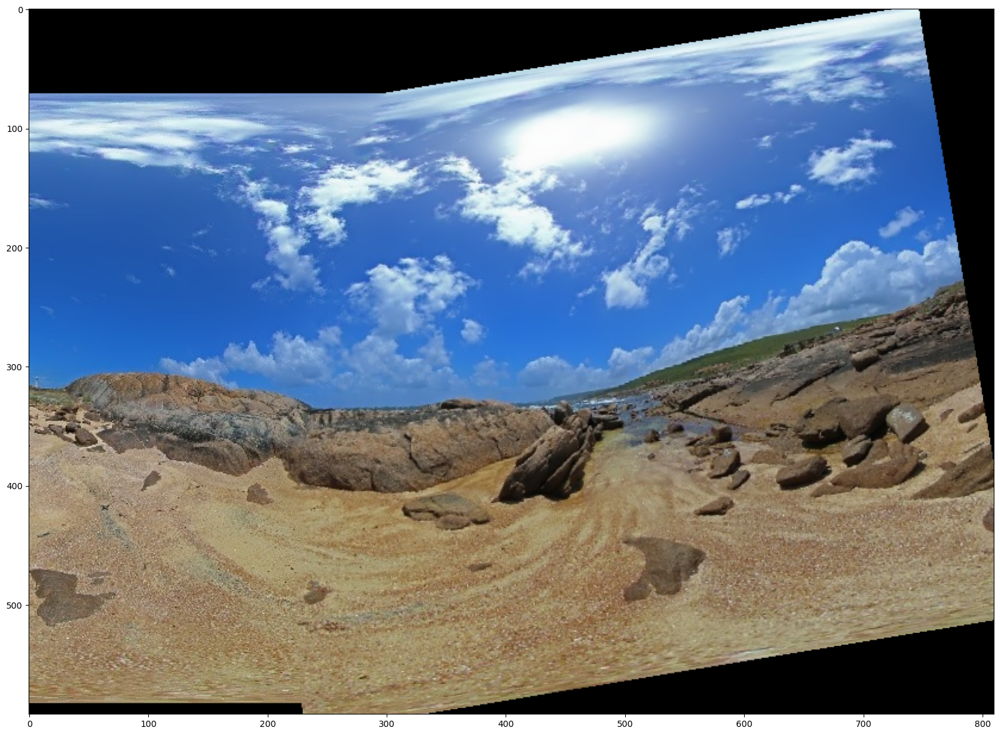

In [63]:
settings = {# The whole plan should be considered
            "crop": False,
            # The matches confidences aren't that good
            "confidence_threshold": 0.26}    

stitcher = AffineStitcher(**settings)
panorama = stitcher.stitch(fish_imgs)

plot_image(panorama, (20,20))